In [32]:
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
from shapely import wkt
from cartoframes.viz import *
import os
import pickle

# 동 경계 데이터, 서울시 도로 데이터 불러오기

## 1. 동 데이터 가져오기

In [ ]:
# 데이터 로드(424개 행정구역 업로드)   -> 이 데이터에는 빈부분이 존재.... (이버전은 사용안함!)
dong_boundary = gpd.read_file('../emd2/행정구역.shp', encoding='CP949')
dong = dong_boundary[dong_boundary['ADM_CD'].str.startswith('11')]

dong['ADM_CD'] = dong['ADM_CD'].astype(str)

# 중복이름 동 방지
dong.loc[(dong['ADM_NM']=='신사동') & (dong['ADM_CD']=='1121068'), 'ADM_NM'] = '신사동(강남)'
dong.loc[(dong['ADM_NM']=='신사동') & (dong['ADM_CD']=='1123051'), 'ADM_NM'] = '신사동(관악)'

# CRS 변환
dong.set_crs(epsg=5179, inplace=True)
dong.to_crs(epsg=4326, inplace=True)

dong = dong.drop(columns=['SIDO_CD', 'SIDO_NM', 'SIGUNGU_CD', 'SIGUNGU_NM', 'ADM_CD'])

# 결과 확인
print(dong.crs)
print(dong.shape)

EPSG:4326
(424, 2)


In [34]:
# 서울시 행정동 데이터
dong_boundary2 = gpd.read_file('../emd/BND_ADM_DONG_PG.shp', encoding='CP949')
dong2 = dong_boundary2[dong_boundary2['ADM_CD'].str.startswith('11')]

dong2.to_crs(epsg=4326, inplace=True)

seoul_boundary2 = dong2.unary_union   # 실제 서울시내 경계 정보

/home/hj/.local/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


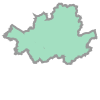

In [35]:
seoul_boundary2

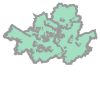

In [36]:
seoul_boundary

## 2. 동별 도로 네트워크 불러오기

In [37]:
layer_dong = Layer(dong,
                    basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('ADM_NM', title='동이름')) # 얹으면 팝업

#layer_dong

In [38]:
# 2. 서울시 전체 도로 네트워크 불러오기
G_seoul = ox.graph_from_polygon(seoul_boundary2, network_type='drive')

In [39]:
# 서울시내 도로 네트워크 정보 저장
nodes, edges = ox.graph_to_gdfs(G_seoul)

In [40]:
from cartoframes.viz import *

layer_seoul = Layer(edges,
                    basic_style(opacity=0.8),) # 투명도
                    #popup_hover=popup_element('name', title='도로명')) # 얹으면 팝업

Map(layers=[layer_seoul, layer_dong])

### 도로 전처리

In [41]:
# 노드 정보 확인
nodes.head()

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
266813237,37.526615,127.000794,3,NaN,NaN,POINT (127.00079 37.52662)
278159482,37.525964,126.997422,3,NaN,NaN,POINT (126.99742 37.52596)
278159676,37.527696,127.002375,3,NaN,NaN,POINT (127.00238 37.52770)
282723724,37.588055,127.023541,3,NaN,NaN,POINT (127.02354 37.58805)
282723780,37.586624,127.025199,3,NaN,NaN,POINT (127.02520 37.58662)


In [42]:
# 간선 정보 확인
edges.head()

osmid    name      highway  oneway reversed  \
u         v          key                                                    
266813237 3771909762 0    373776969  보광로12길  residential   False    False   
          436847094  0    373776969  보광로12길  residential   False     True   
          3771899749 0    373776966  보광로14길  residential   False    False   
278159482 1378780898 0     25524218   보광로7길  residential   False    False   
          1378780857 0     97836950     장문로     tertiary   False    False   

                          length  \
u         v          key           
266813237 3771909762 0    27.605   
          436847094  0    20.002   
          3771899749 0    69.877   
278159482 1378780898 0    66.892   
          1378780857 0    22.683   

                                                                   geometry  \
u         v          key                                                      
266813237 3771909762 0    LINESTRING (127.00079 37.52662, 127.00109 37.5...   
          436847094  0    LINESTRING (127.00079 37.52662, 127.00062 37.5...   
          3771899749 0    LINESTRING (127.00079 37.52662, 127.00059 37.5...   
278159482 1378780898 0    LINESTRING (126.99742 37.52596, 126.99813 37.5...   
          1378780857 0    LINESTRING (126.99742 37.52596, 126.99717 37.5...   

                         lanes maxspeed  ref bridge tunnel junction access  \
u         v          key                                                     
266813237 3771909762 0     NaN      NaN  NaN    NaN    NaN      NaN    NaN   
          436847094  0     NaN      NaN  NaN    NaN    NaN      NaN    NaN   
          3771899749 0     NaN      NaN  NaN    NaN    NaN      NaN    NaN   
278159482 1378780898 0     NaN      NaN  NaN    NaN    NaN      NaN    NaN   
          1378780857 0     NaN      NaN  NaN    NaN    NaN      NaN    NaN   

                         width service  
u         v          key                
266813237 3771909762 0     NaN     NaN  
          436847094  0     NaN     NaN  
          3771899749 0     NaN     NaN  
278159482 1378780898 0     NaN     NaN  
          1378780857 0     NaN     NaN

In [43]:
# null 값 개수
nan_counts = edges.isna().sum()
print(nan_counts)
print(f"전체 도로 개수: {len(edges)}")

# 전체 개수에 비해 null인 값이 너무 많다. -> [osmid, name, highway, oneway, length, geometry, bridge, tunnel] 정도만 살리고 나머지 제거

osmid            0
name         16673
highway          0
oneway           0
reversed         0
length           0
geometry         0
lanes       175550
maxspeed    184489
ref         182933
bridge      187951
tunnel      188902
junction    189390
access      188923
width       189315
service     189530
dtype: int64
전체 도로 개수: 189532


In [44]:
# 사용할 정보만 가져오기
new_edges = edges[['osmid', 'name', 'highway', 'oneway', 'length', 'geometry', 'bridge', 'tunnel']]
new_edges.head()

osmid    name      highway  oneway  length  \
u         v          key                                                   
266813237 3771909762 0    373776969  보광로12길  residential   False  27.605   
          436847094  0    373776969  보광로12길  residential   False  20.002   
          3771899749 0    373776966  보광로14길  residential   False  69.877   
278159482 1378780898 0     25524218   보광로7길  residential   False  66.892   
          1378780857 0     97836950     장문로     tertiary   False  22.683   

                                                                   geometry  \
u         v          key                                                      
266813237 3771909762 0    LINESTRING (127.00079 37.52662, 127.00109 37.5...   
          436847094  0    LINESTRING (127.00079 37.52662, 127.00062 37.5...   
          3771899749 0    LINESTRING (127.00079 37.52662, 127.00059 37.5...   
278159482 1378780898 0    LINESTRING (126.99742 37.52596, 126.99813 37.5...   
          1378780857 0    LINESTRING (126.99742 37.52596, 126.99717 37.5...   

                         bridge tunnel  
u         v          key                
266813237 3771909762 0      NaN    NaN  
          436847094  0      NaN    NaN  
          3771899749 0      NaN    NaN  
278159482 1378780898 0      NaN    NaN  
          1378780857 0      NaN    NaN

In [45]:
cols = new_edges.columns
for col in cols:
    print(edges[col].value_counts())

osmid
183272323                              74
37403279                               66
218681391                              64
198564928                              62
37399402                               62
                                       ..
518705246                               1
330258692                               1
520474615                               1
520731344                               1
[1339768064, 379795872, 1062637071]     1
Name: count, Length: 47735, dtype: int64
name
남부순환로                 597
통일로                   501
한천로                   424
동일로                   416
삼양로                   412
                     ... 
테헤란로107길                1
낙천정지하도                  1
자양중앙나들목                 1
[풍성로65길, 천호대로182길]      1
[전농로29길, 전농로]           1
Name: count, Length: 13261, dtype: int64
highway
residential                             146500
secondary                                16865
tertiary                                 10781
primary   

geometry
LINESTRING (127.06309 37.59578, 127.06279 37.5...    2
LINESTRING (126.92469 37.57357, 126.92464 37.5...    2
LINESTRING (126.90252 37.44965, 126.90253 37.4...    2
LINESTRING (127.05856 37.53489, 127.05854 37.5...    2
LINESTRING (126.98672 37.57907, 126.98672 37.5...    2
                                                    ..
LINESTRING (127.05239 37.58531, 127.05235 37.5...    1
LINESTRING (127.05239 37.58531, 127.05247 37.5...    1
LINESTRING (127.05276 37.58463, 127.05269 37.5...    1
LINESTRING (127.05276 37.58463, 127.05287 37.5...    1
LINESTRING (127.05492 37.58765, 127.05481 37.5...    1
Name: count, Length: 189475, dtype: int64
bridge
yes                   1540
viaduct                 30
[yes, viaduct]           9
low_water_crossing       2
Name: count, dtype: int64
tunnel
yes                 601
building_passage     29
Name: count, dtype: int64


* highway 전처리

In [46]:
# 도로 우선순위를 설정 (우선순위가 높을수록 중요한 도로)
highway_priority = {
    'motorway': 1,
    'motorway_link': 2,
    'trunk': 3,
    'trunk_link': 4,
    'primary': 5,
    'primary_link': 6,
    'secondary': 7,
    'secondary_link': 8,
    'tertiary': 9,
    'tertiary_link': 10,
    'unclassified': 11,
    'residential': 12,
    'living_street': 13,
    'service': 14,
    'pedestrian': 15,
    'track': 16,
    'path': 17
}

# 여러 개의 highway 값을 가진 행에 대해 우선순위가 높은 값 선택
def select_primary_highway(highway):
    # highway가 리스트 형식일 경우
    if isinstance(highway, list):
        # 우선순위에 따라 정렬하고 가장 우선순위가 높은 값 반환
        return sorted(highway, key=lambda x: highway_priority.get(x, float('inf')))[0]
    return highway  # 단일 값이면 그대로 반환

# highway 열을 업데이트하여 단일 값으로 통일
new_edges['highway'] = new_edges['highway'].apply(lambda x: select_primary_highway(x) if isinstance(x, list) else x)

print(new_edges['highway'].value_counts())

highway
residential       146524
secondary          16900
tertiary           10831
primary             6819
living_street       2688
secondary_link      1566
busway               943
trunk_link           892
primary_link         823
unclassified         697
trunk                453
tertiary_link        290
motorway_link         78
motorway              19
road                   4
crossing               4
disused                1
Name: count, dtype: int64


/home/hj/.local/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [47]:
# 변환 후 리스트 형태의 값이 남아있는지 확인
# print(edges[edges['highway'].apply(lambda x: isinstance(x, list))])

In [48]:
print(new_edges['highway'].dtype)

object


* bridge 전처리

In [49]:
def categorize_bridge(value):
    if isinstance(value, list):
        # 리스트에 'viaduct'가 있으면 2 (고가도로), 'yes'만 있으면 1 (일반 다리)
        if 'viaduct' in value:
            return 2
        elif 'yes' in value:
            return 1
    elif value == 'viaduct':
        return 2  # 고가도로
    elif value == 'yes':
        return 1  # 일반 다리
    return 0  # 다리 정보 없음

# bridge 열 변환 적용
new_edges['bridge'] = new_edges['bridge'].apply(categorize_bridge)

print(new_edges['bridge'].value_counts())

bridge
0    187953
1      1540
2        39
Name: count, dtype: int64


/home/hj/.local/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


* tunnel 전처리

In [50]:
# 터널 유형을 0, 1, 2로 구분하는 함수 정의
def categorize_tunnel(value):
    if value == 'building_passage':
        return 2  # 건물 통과 구간
    elif value == 'yes':
        return 1  # 일반 터널
    return 0  # 터널 정보 없음

# tunnel 열 변환 적용
new_edges['tunnel'] = new_edges['tunnel'].apply(categorize_tunnel)

# 변환 결과 확인
print(new_edges['tunnel'].value_counts())


tunnel
0    188902
1       601
2        29
Name: count, dtype: int64


### 동별 도로 배정

In [51]:
# 인접 동 리스트를 저장할 컬럼 추가
neighbors = {}

dong.to_crs(epsg=5179, inplace=True)

# 각 동에 대해 다른 동들과 비교하여 인접 동 계산
for idx, row in dong.iterrows():
    dong_name = row['ADM_NM']      # 현재 동의 이름
    current_geom = row['geometry'] # 현재 동의 지리정보
    friends = dong[(dong.geometry.intersects(current_geom)) & (dong['ADM_NM'] != dong_name)]['ADM_NM'].tolist()  # 인접 조건: 경계가 닿는 동들
    
    neighbors[dong_name] = friends

neighbors

{'사직동': ['무악동', '교남동', '종로1·2·3·4가동', '청운효자동', '소공동', '명동'],
 '삼청동': ['부암동', '가회동', '종로1·2·3·4가동', '청운효자동', '혜화동', '성북동'],
 '부암동': ['삼청동', '평창동', '청운효자동', '성북동', '홍제3동', '홍은1동'],
 '평창동': ['부암동', '정릉3동', '성북동', '불광1동', '진관동', '홍은1동'],
 '무악동': ['사직동', '교남동', '청운효자동', '천연동', '홍제1동', '홍제2동'],
 '교남동': ['사직동', '무악동', '소공동'],
 '가회동': ['삼청동', '종로1·2·3·4가동', '혜화동'],
 '종로1·2·3·4가동': ['사직동',
  '삼청동',
  '가회동',
  '종로5·6가동',
  '이화동',
  '청운효자동',
  '혜화동',
  '명동',
  '을지로동'],
 '종로5·6가동': ['종로1·2·3·4가동', '이화동', '창신1동', '창신2동', '광희동', '을지로동', '신당동'],
 '이화동': ['종로1·2·3·4가동', '종로5·6가동', '창신2동', '혜화동', '삼선동'],
 '창신1동': ['종로5·6가동', '창신2동', '창신3동', '숭인2동', '황학동', '신당동'],
 '창신2동': ['종로5·6가동', '이화동', '창신1동', '창신3동', '삼선동'],
 '창신3동': ['창신1동', '창신2동', '숭인1동', '삼선동'],
 '숭인1동': ['창신3동', '숭인2동', '보문동', '삼선동'],
 '숭인2동': ['창신1동', '숭인1동', '황학동', '용신동', '보문동'],
 '청운효자동': ['사직동', '삼청동', '부암동', '무악동', '종로1·2·3·4가동', '홍제3동', '홍제2동'],
 '혜화동': ['삼청동', '가회동', '종로1·2·3·4가동', '이화동', '성북동', '삼선동'],
 '소공동': ['사직동', '교남동', '회현동', '

In [52]:
# 동별 동내 도로 데이터를 저장할 딕셔너리 생성
dong.to_crs(epsg=4326, inplace=True)

dong_road_dataframes = {}

# 각 도로가 포함된 동을 확인하여 동별로 분류
for idx, row in dong.iterrows():
    dong_name = row['ADM_NM']
    dong_boundary = row['geometry']
    
    # 동 경계에 포함된 도로 필터링
    roads_in_dong = new_edges[new_edges['geometry'].within(dong_boundary)]
    
    # 동 이름을 키로 사용하여 도로 데이터프레임을 저장
    dong_road_dataframes[dong_name] = roads_in_dong.reset_index(drop=True)

In [53]:
# 확인
dong_road_dataframes['사직동']

,osmid,name,highway,oneway,length,geometry,bridge,tunnel
0,919985573,새문안로3길,residential,False,5.927,"LINESTRING (126.97255 37.57005, 126.97255 37.5...",0,0
1,919985574,새문안로,primary,True,168.025,"LINESTRING (126.97255 37.57005, 126.97446 37.5...",0,0
2,180793307,새문안로,residential,False,69.998,"LINESTRING (126.97255 37.57005, 126.97267 37.5...",0,0
3,37399752,사직로8길,tertiary,False,157.510,"LINESTRING (126.97269 37.57404, 126.97344 37.5...",0,0
4,37399752,사직로8길,tertiary,False,219.576,"LINESTRING (126.97269 37.57404, 126.97210 37.5...",0,0
...,...,...,...,...,...,...,...,...
209,1322056285,NaN,busway,True,399.097,"LINESTRING (126.97707 37.57024, 126.97690 37.5...",0,0
210,198566325,세종대로,primary,True,4.264,"LINESTRING (126.97724 37.57024, 126.97724 37.5...",0,0
211,1322056285,NaN,busway,True,14.384,"LINESTRING (126.97724 37.57024, 126.97707 37.5...",0,0
212,621513148,NaN,busway,True,59.296,"LINESTRING (126.97005 37.56895, 126.96949 37.5...",0,0


In [54]:
# 시각화
l1 = Layer(dong_road_dataframes['사직동'], basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('name', title='도로명')) # 얹으면 팝업

l2 = Layer(dong, basic_style(opacity=0.2), popup_hover=popup_element('ADM_NM', title='Region')) # 투명도

#Map([l1, l2])

In [55]:
# 동별 도로 임베딩을 저장할 데이터프레임 초기화
dong_embeddings = []

for dong_name, roads_df in dong_road_dataframes.items():
    # 1. 도로 개수
    road_count = len(roads_df)
    
    # 2. highway 값별 개수
    #print(dong_name)
    #print(roads_df[roads_df['highway'].apply(lambda x: isinstance(x, list))])
    highway_counts = roads_df['highway'].value_counts().to_dict()
    
    # 3. 총 길이
    total_length = roads_df['length'].sum()
    
    # 4. 터널 개수 (일반 터널과 건물 통과 구간)
    tunnel_counts = roads_df['tunnel'].value_counts().reindex([1, 2], fill_value=0).to_dict()
    
    # 5. 다리 개수 (일반 다리와 고가도로)
    bridge_counts = roads_df['bridge'].value_counts().reindex([1, 2], fill_value=0).to_dict()
    
    # 6. 임베딩 벡터 구성
    embedding = {
        'ADM_NM': dong_name,
        'road_count': road_count,
        'total_length': total_length,
        'tunnel_count_general': tunnel_counts.get(1, 0),
        'tunnel_count_building_passage': tunnel_counts.get(2, 0),
        'bridge_count_general': bridge_counts.get(1, 0),
        'bridge_count_viaduct': bridge_counts.get(2, 0)
    }
    
    # highway별 개수를 임베딩에 추가
    for highway_type, count in highway_counts.items():
        embedding[f'highway_count_{highway_type}'] = count
    
    # 동별 임베딩 리스트에 추가
    dong_embeddings.append(embedding)

# 동별 임베딩 데이터프레임 생성
dong_embeddings_df = pd.DataFrame(dong_embeddings).fillna(0)  # NaN 값은 0으로 채움

# 결과 확인
dong_embeddings_df.head()

,ADM_NM,road_count,total_length,tunnel_count_general,tunnel_count_building_passage,bridge_count_general,bridge_count_viaduct,highway_count_residential,highway_count_primary,highway_count_tertiary,...,highway_count_primary_link,highway_count_secondary,highway_count_secondary_link,highway_count_unclassified,highway_count_trunk_link,highway_count_trunk,highway_count_road,highway_count_motorway_link,highway_count_crossing,highway_count_motorway
0,사직동,214,22040.495,0,0,0,0,84.0,45.0,30.0,...,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,삼청동,21,3985.162,0,0,0,0,11.0,2.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,부암동,375,36188.775,0,0,14,0,295.0,12.0,28.0,...,2.0,24.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,평창동,717,74985.331,0,0,4,0,675.0,37.0,0.0,...,0.0,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,무악동,93,6368.146,0,0,0,0,26.0,8.0,0.0,...,0.0,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [56]:
dong.head()

,ADM_NM,geometry
0,사직동,"POLYGON ((126.97399 37.57823, 126.97400 37.578..."
1,삼청동,"POLYGON ((126.97714 37.59768, 126.97730 37.597..."
2,부암동,"POLYGON ((126.96253 37.60575, 126.96246 37.605..."
3,평창동,"POLYGON ((126.97508 37.63118, 126.97468 37.629..."
4,무악동,"POLYGON ((126.96079 37.57378, 126.96074 37.573..."


In [57]:
# 동별 연결된 동과의 도로 개수 저장 ex) 사직동 -> [(무악동, 2), (종로1·2·3·4가동, 3)..] -> 이거 자체로 edge가 된다!
connections = {}

dong.to_crs(epsg=5179, inplace=True)
new_edges.to_crs(epsg=5179, inplace=True)

for start, targets in neighbors.items():
    dong_boundary = dong.loc[dong['ADM_NM']==start, 'geometry'].values[0]   # 시작동 경계
    
    # 이웃한 동들 도로개수 계산
    for target in targets:
        target_boundary = dong.loc[dong['ADM_NM']==target, 'geometry'].values[0]
        
        # 공유하는 도로의 개수 확인
        connecting_roads = new_edges[new_edges['geometry'].intersects(dong_boundary) &
                                     new_edges['geometry'].intersects(target_boundary)]
        connected_counts = len(connecting_roads)  # 공유 도로 개수
        
        # 업데이트
        if start not in connections:
            connections[start] = []
        if connected_counts == 0:
            connected_counts = 0.1   # 인접성 정보 유지
        connections[start].append([target, connected_counts])
        

/home/hj/.local/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [58]:
dong.to_crs(epsg=4326, inplace=True)
new_edges.to_crs(epsg=4326, inplace=True)
connections

/home/hj/.local/lib/python3.10/site-packages/geopandas/geodataframe.py:1528: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


{'사직동': [['무악동', 2],
  ['교남동', 9],
  ['종로1·2·3·4가동', 11],
  ['청운효자동', 15],
  ['소공동', 6],
  ['명동', 4]],
 '삼청동': [['부암동', 0.1],
  ['가회동', 8],
  ['종로1·2·3·4가동', 9],
  ['청운효자동', 9],
  ['혜화동', 4],
  ['성북동', 2]],
 '부암동': [['삼청동', 0.1],
  ['평창동', 17],
  ['청운효자동', 6],
  ['성북동', 2],
  ['홍제3동', 4],
  ['홍은1동', 2]],
 '평창동': [['부암동', 17],
  ['정릉3동', 6],
  ['성북동', 6],
  ['불광1동', 2],
  ['진관동', 0.1],
  ['홍은1동', 4]],
 '무악동': [['사직동', 2],
  ['교남동', 29],
  ['청운효자동', 2],
  ['천연동', 14],
  ['홍제1동', 2],
  ['홍제2동', 3]],
 '교남동': [['사직동', 9], ['무악동', 29], ['소공동', 4]],
 '가회동': [['삼청동', 8], ['종로1·2·3·4가동', 10], ['혜화동', 4]],
 '종로1·2·3·4가동': [['사직동', 11],
  ['삼청동', 9],
  ['가회동', 10],
  ['종로5·6가동', 23],
  ['이화동', 4],
  ['청운효자동', 4],
  ['혜화동', 3],
  ['명동', 5],
  ['을지로동', 5]],
 '종로5·6가동': [['종로1·2·3·4가동', 23],
  ['이화동', 24],
  ['창신1동', 7],
  ['창신2동', 0.1],
  ['광희동', 4],
  ['을지로동', 4],
  ['신당동', 0.1]],
 '이화동': [['종로1·2·3·4가동', 4],
  ['종로5·6가동', 24],
  ['창신2동', 2],
  ['혜화동', 7],
  ['삼선동', 2]],
 '창신1동': [['종로5·6가동', 7],


In [59]:
# 동별 면적 계산
dong.to_crs(epsg=5179, inplace=True)
dong_area = dong.copy()
dong_area['area'] = dong_area['geometry'].area 

# 최종 동 임베딩 생성
dong_info = dong_embeddings_df.merge(dong_area[['ADM_NM', 'area']], on='ADM_NM', how='inner')

# 동 임베딩 저장
dong_info.to_csv('../Dataset/dong_road_info.csv', index=False)

dong_info

,ADM_NM,road_count,total_length,tunnel_count_general,tunnel_count_building_passage,bridge_count_general,bridge_count_viaduct,highway_count_residential,highway_count_primary,highway_count_tertiary,...,highway_count_secondary,highway_count_secondary_link,highway_count_unclassified,highway_count_trunk_link,highway_count_trunk,highway_count_road,highway_count_motorway_link,highway_count_crossing,highway_count_motorway,area
0,사직동,214,22040.495,0,0,0,0,84.0,45.0,30.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.158538e+06
1,삼청동,21,3985.162,0,0,0,0,11.0,2.0,8.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.478148e+06
2,부암동,375,36188.775,0,0,14,0,295.0,12.0,28.0,...,24.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.272862e+06
3,평창동,717,74985.331,0,0,4,0,675.0,37.0,0.0,...,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.941185e+06
4,무악동,93,6368.146,0,0,0,0,26.0,8.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.692457e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
419,둔촌1동,36,4638.582,0,0,0,0,12.0,0.0,7.0,...,12.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.114673e+05
420,둔촌2동,715,42144.786,2,0,0,0,608.0,7.0,78.0,...,20.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.549246e+06
421,암사1동,794,41197.654,0,0,0,0,708.0,10.0,44.0,...,32.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7.349077e+05
422,천호2동,956,58649.447,2,0,7,0,787.0,51.0,40.0,...,64.0,0.0,0.0,12.0,1.0,0.0,0.0,0.0,0.0,1.849419e+06


In [60]:
# 그래프 생성
G = nx.Graph()

# 그래프에 노드와 엣지 추가
for key, edges in connections.items():
    for value in edges:
        target, weight = value
        G.add_edge(key, target, weight=weight)

# 그래프 정보 출력
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")
     
# 그래프 저장
output_file = os.path.join('../Dataset/Road_Graph', "road_graph.gpickle")
with open(output_file, 'wb') as f:
    pickle.dump(G, f)

Number of nodes: 424
Number of edges: 1163


In [61]:
# 그래프 시각화
dong = dong
dong['centroid'] = dong['geometry'].centroid

dong.to_crs(epsg=4326, inplace=True)

# 노드에 추가 속성 주기
for node in G.nodes():
    G.nodes[node]['x'] = dong.loc[dong['ADM_NM'] == node, 'centroid'].x.values[0]
    G.nodes[node]['y'] = dong.loc[dong['ADM_NM'] == node, 'centroid'].y.values[0]

In [62]:
# # 그래프 시각화
# dong_info['centroid'] = dong_info['geometry'].centroid

# # 도로 네트워크 그래프 생성
# road_G = nx.Graph()

# # 각 동별로 엣지 추가
# for _, row in dong_info.iterrows():
#     dong_name = row['dong_name']  # 현재 동 이름
#     neighbors = row['neighbors']  # 인접 동 인덱스 리스트
#     connected_counts = row['connected_road_counts']  # 인접 동별 연결 도로 개수 (딕셔너리 형태)
#     centroid = row['centroid']  # 현재 동의 중심 좌표
#     road_G.add_node(dong_name, x=centroid.x, y=centroid.y)

#     # 현재 동과 인접 동을 순회하여 엣지 추가
#     for neighbor_name, road_count in connected_counts.items():
#         if road_count > 0:
#             # 동과 인접 동 간의 엣지를 추가하고, 연결 도로 개수를 weight로 설정
#             road_G.add_edge(dong_name, neighbor_name, weight=road_count)

# # 결과 확인: 그래프의 엣지 리스트
# print("동 네트워크 엣지 (동 이름과 가중치):")
# print(list(road_G.edges(data=True)))


In [63]:
from cartoframes.viz import Layer, Map, color_bins_style, basic_style
from shapely.geometry import LineString
import pandas as pd
import geopandas as gpd

# 1. G의 노드와 엣지 정보를 DataFrame으로 변환 (시각화를 위해)
nodes_df = pd.DataFrame({
    'dong_name': list(G.nodes),
    'longitude': [G.nodes[node]['x'] for node in G.nodes],
    'latitude': [G.nodes[node]['y'] for node in G.nodes]
})

# 노드에 geometry 열 생성
nodes_gdf = gpd.GeoDataFrame(
    nodes_df, 
    geometry=gpd.points_from_xy(nodes_df.longitude, nodes_df.latitude),
    crs="EPSG:5179"
)

nodes_gdf.to_crs(epsg=4326, inplace=True)

# 엣지 데이터프레임 생성
edges_df = pd.DataFrame([
    {
        'source': u,
        'target': v,
        'weight': d['weight'],
        'source_x': G.nodes[u]['x'],
        'source_y': G.nodes[u]['y'],
        'target_x': G.nodes[v]['x'],
        'target_y': G.nodes[v]['y']
    }
    for u, v, d in G.edges(data=True)
])

# 엣지 데이터프레임에 LineString을 사용한 geometry 열 추가
edges_df['geometry'] = edges_df.apply(
    lambda row: LineString([(row['source_x'], row['source_y']), (row['target_x'], row['target_y'])]),
    axis=1
)
edges_gdf = gpd.GeoDataFrame(edges_df, geometry='geometry', crs="EPSG:5179")
edges_gdf.to_crs(epsg=4326, inplace=True)

# 3. 노드와 엣지 레이어 생성 (geom_col 사용)
nodes_layer = Layer(
    nodes_gdf,
    basic_style(
        color='red',
        size=5
    ),
    geom_col='geometry',
    title='Nodes'
)

edges_layer = Layer(
    edges_gdf,
    color_bins_style(
        'weight',
        bins=5,
        palette='TealRose',
        stroke_width=1
    ),
    geom_col='geometry',
    title='Edges'
)

# 4. Map에 노드와 엣지 레이어 추가
Map(layers=[edges_layer, nodes_layer])


In [64]:
print(connections['상암동'])
print(neighbors['상암동'])

dong.to_crs(epsg=4326, inplace=True)

[['수색동', 4], ['북가좌1동', 1], ['망원1동', 3], ['망원2동', 10], ['성산2동', 23], ['양평2동', 2]]
['수색동', '북가좌1동', '망원1동', '망원2동', '성산2동', '양평2동']


In [65]:
layer_seoul = Layer(edges,
                    basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('name', title='도로명')) # 얹으면 팝업

layer_seoul

ValueError: Wrong source. Valid sources are string, DataFrame or GeoDataFrame.

In [ ]:
sang = dong[dong['ADM_NM']=='상암동']
yum = dong[dong['ADM_NM']=='염창동']
ga2 = dong[dong['ADM_NM']=='가양2동']

s_layer = Layer(sang,basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('ADM_NM', title='도로명'))
y_layer = Layer(yum,basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('ADM_NM', title='도로명'))
g_layer = Layer(ga2,basic_style(opacity=0.8), # 투명도
                    popup_hover=popup_element('ADM_NM', title='도로명'))

# 지하철 정보 결합